In [2]:
!pip install rasterio geopandas numpy opencv-python matplotlib seaborn scikit-image


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 323.6/323.6 kB 10.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.7/14.7 MB 7.4 MB/s eta 0:00:0000:0100:01m
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.9/4.9 MB 9.3 MB/s eta 0:00:00a 0:00:01m
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 12.2 MB/s eta 0:00:00a 0:00:01


In [4]:
import rasterio
import geopandas as gpd
import numpy as np
import cv2
import matplotlib.pyplot as plt
import seaborn as sns
from skimage import exposure


In [6]:
import rasterio

def load_image(file_path):
    with rasterio.open(file_path) as src:
        data = src.read(1)  # Read the first band
        transform = src.transform
        return data, transform


blue_band_path = '/Users/vishaljadhav/Desktop/satellite images and data/LC09_L2SP_148036_20220205_20230428_02_T1_SR_B1.TIF'
green_band_path = '/Users/vishaljadhav/Desktop/satellite images and data/LC09_L2SP_148036_20220205_20230428_02_T1_SR_B2.TIF'
red_band_path = '/Users/vishaljadhav/Desktop/satellite images and data/LC09_L2SP_148036_20220205_20230428_02_T1_SR_B3.TIF'
nir_band_path = '/Users/vishaljadhav/Desktop/satellite images and data/LC09_L2SP_148036_20220205_20230428_02_T1_SR_B4.TIF'


blue_band, blue_transform = load_image(blue_band_path)
green_band, green_transform = load_image(green_band_path)
red_band, red_transform = load_image(red_band_path)
nir_band, nir_transform = load_image(nir_band_path)


print(f"Blue Band Shape: {blue_band.shape}")
print(f"Green Band Shape: {green_band.shape}")
print(f"Red Band Shape: {red_band.shape}")
print(f"NIR Band Shape: {nir_band.shape}")


Blue Band Shape: (7751, 7621)
Green Band Shape: (7751, 7621)
Red Band Shape: (7751, 7621)
NIR Band Shape: (7751, 7621)


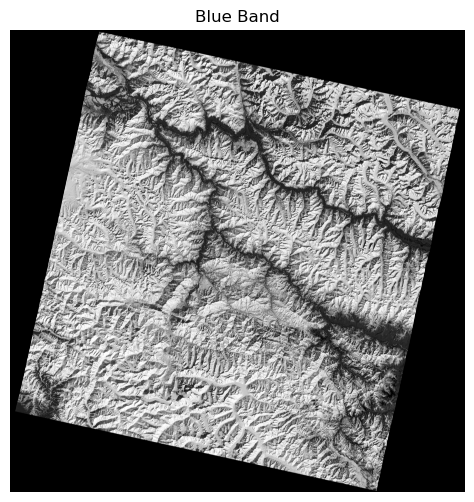

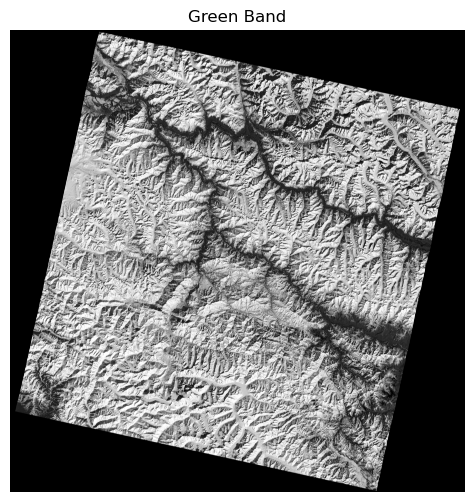

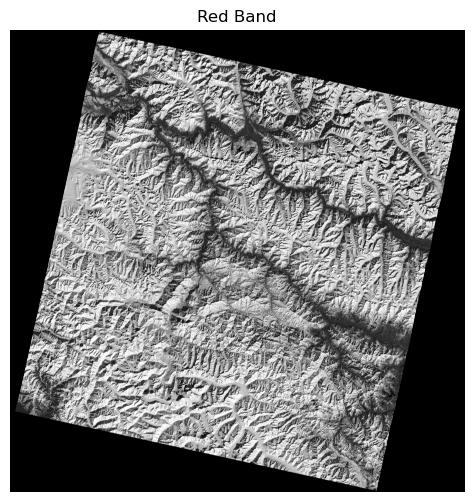

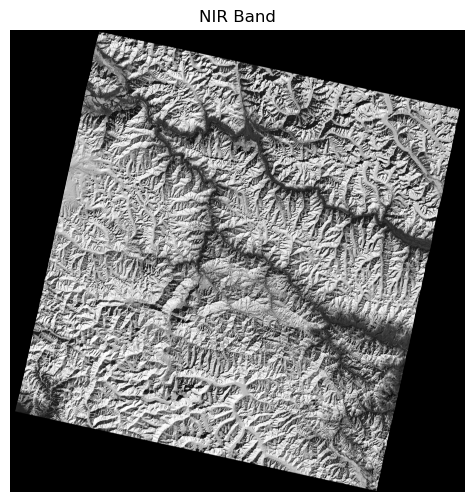

In [8]:
import matplotlib.pyplot as plt

def display_image(image, title=''):
    plt.figure(figsize=(6, 6))
    plt.imshow(image, cmap='gray')
    plt.title(title)
    plt.axis('off')
    plt.show()


display_image(blue_band, 'Blue Band')
display_image(green_band, 'Green Band')
display_image(red_band, 'Red Band')
display_image(nir_band, 'NIR Band')


In [10]:
import numpy as np

def normalize_image(image):
    # Normalize the image to the range [0, 1]
    image = image.astype(float)
    image_min = np.min(image)
    image_max = np.max(image)
    normalized_image = (image - image_min) / (image_max - image_min)
    return normalized_image

# Normalize each band
blue_band_normalized = normalize_image(blue_band)
green_band_normalized = normalize_image(green_band)
red_band_normalized = normalize_image(red_band)
nir_band_normalized = normalize_image(nir_band)


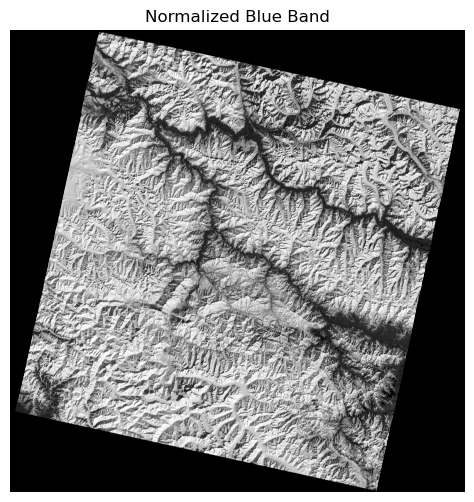

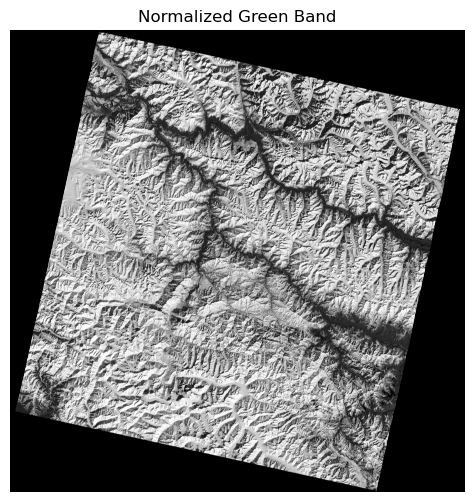

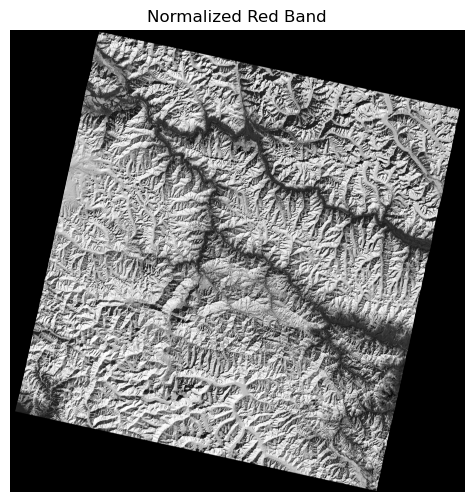

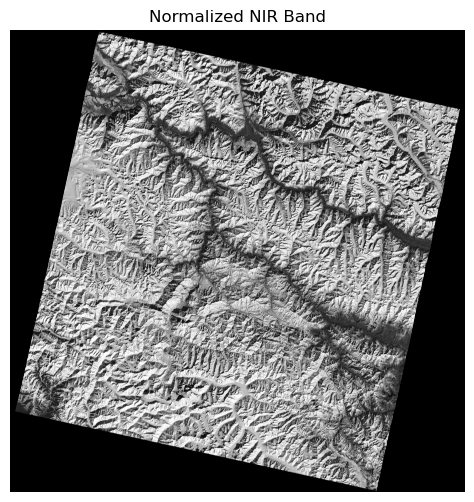

In [12]:
# Display normalized images
display_image(blue_band_normalized, 'Normalized Blue Band')
display_image(green_band_normalized, 'Normalized Green Band')
display_image(red_band_normalized, 'Normalized Red Band')
display_image(nir_band_normalized, 'Normalized NIR Band')


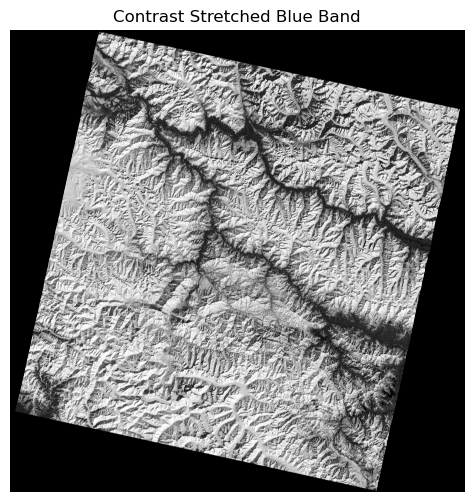

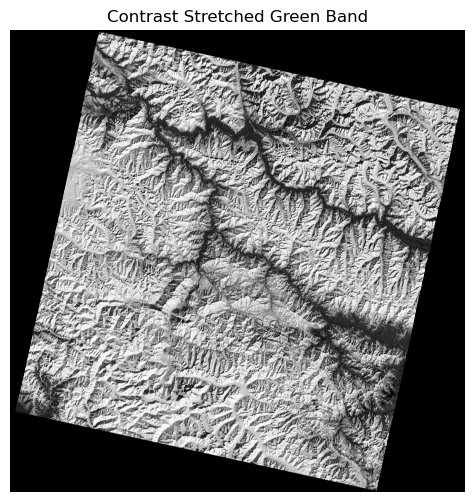

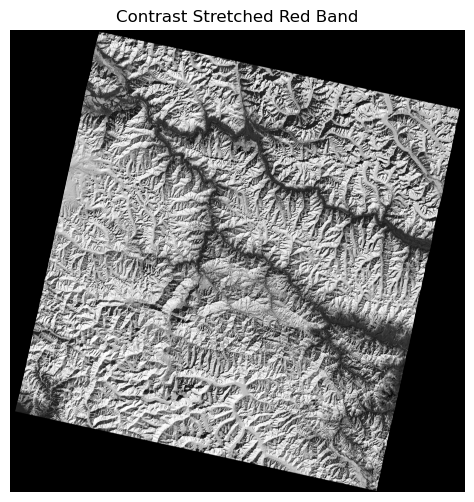

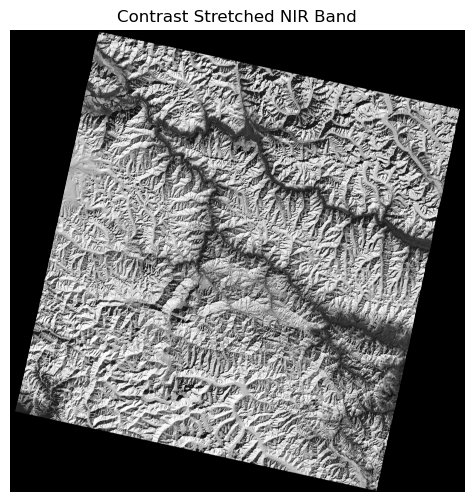

In [14]:
def contrast_stretch(image, lower_percentile=2, upper_percentile=98):
    """Apply contrast stretching to an image."""
    lower = np.percentile(image, lower_percentile)
    upper = np.percentile(image, upper_percentile)
    stretched_image = np.clip((image - lower) / (upper - lower), 0, 1)
    return stretched_image

# Apply contrast stretching
blue_band_contrast = contrast_stretch(blue_band_normalized)
green_band_contrast = contrast_stretch(green_band_normalized)
red_band_contrast = contrast_stretch(red_band_normalized)
nir_band_contrast = contrast_stretch(nir_band_normalized)

# Display contrast stretched images
display_image(blue_band_contrast, 'Contrast Stretched Blue Band')
display_image(green_band_contrast, 'Contrast Stretched Green Band')
display_image(red_band_contrast, 'Contrast Stretched Red Band')
display_image(nir_band_contrast, 'Contrast Stretched NIR Band')


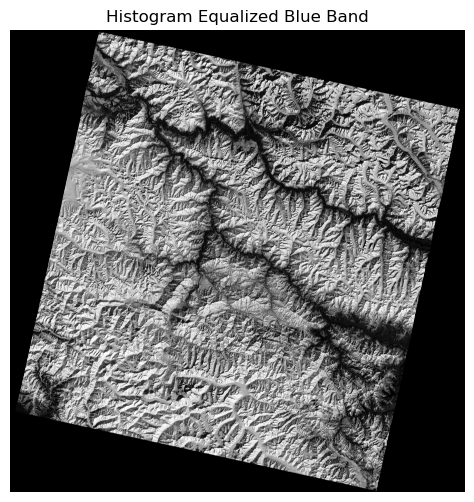

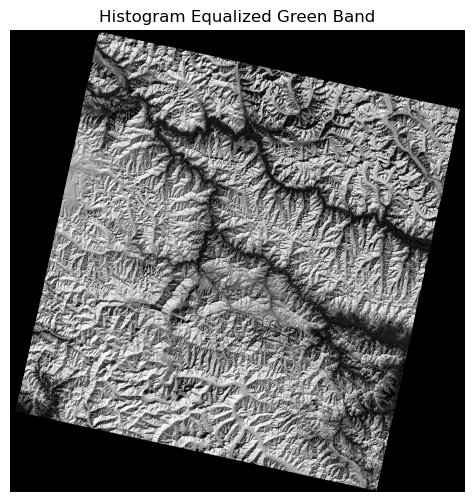

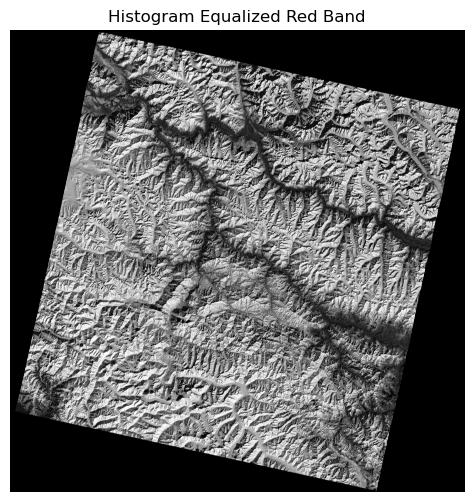

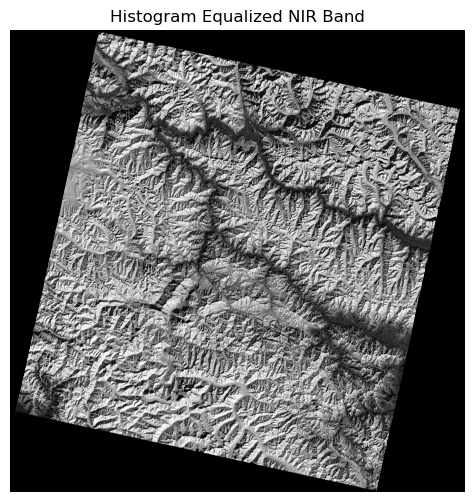

In [16]:
from skimage import exposure

def equalize_histogram(image):
    """Apply histogram equalization to an image."""
    return exposure.equalize_hist(image)

# Apply histogram equalization
blue_band_eq = equalize_histogram(blue_band_normalized)
green_band_eq = equalize_histogram(green_band_normalized)
red_band_eq = equalize_histogram(red_band_normalized)
nir_band_eq = equalize_histogram(nir_band_normalized)

# Display histogram equalized images
display_image(blue_band_eq, 'Histogram Equalized Blue Band')
display_image(green_band_eq, 'Histogram Equalized Green Band')
display_image(red_band_eq, 'Histogram Equalized Red Band')
display_image(nir_band_eq, 'Histogram Equalized NIR Band')


/var/folders/79/qb_cgrln40qcy8hz5dxxxt2c0000gn/T/ipykernel_45249/1527515329.py:3: RuntimeWarning: invalid value encountered in divide
  ndvi = (nir_band - red_band) / (nir_band + red_band)


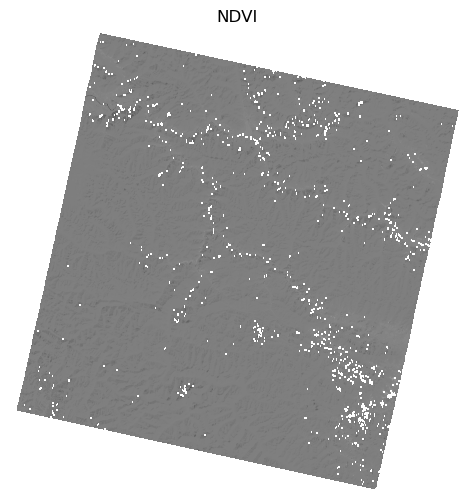

In [18]:
def calculate_ndvi(nir_band, red_band):
    """Calculate NDVI from NIR and Red bands."""
    ndvi = (nir_band - red_band) / (nir_band + red_band)
    return ndvi

# Compute NDVI
ndvi = calculate_ndvi(nir_band_normalized, red_band_normalized)

# Display NDVI
display_image(ndvi, 'NDVI')


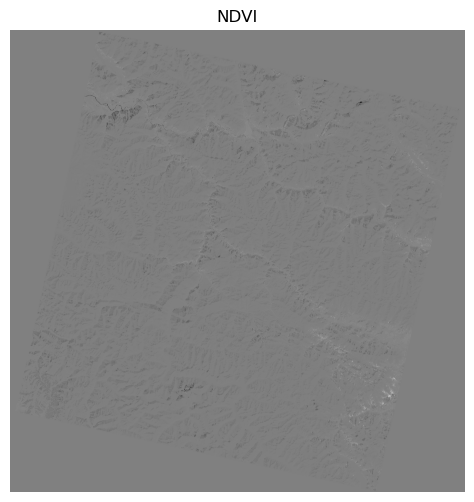

In [20]:
def calculate_ndvi(nir_band, red_band, epsilon=1e-10):
    """Calculate NDVI from NIR and Red bands with a small constant to avoid division by zero."""
    # Avoid division by zero by adding a small constant (epsilon)
    ndvi = (nir_band - red_band) / (nir_band + red_band + epsilon)
    return ndvi

# Compute NDVI with adjusted function
ndvi = calculate_ndvi(nir_band_normalized, red_band_normalized)

# Display NDVI
display_image(ndvi, 'NDVI')


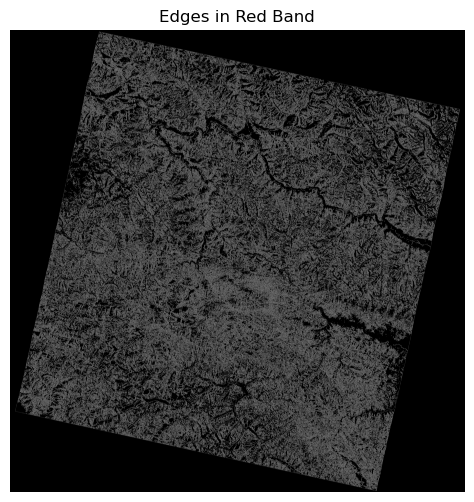

In [22]:
import cv2

def detect_edges(image):
    """Apply Canny edge detection."""
    return cv2.Canny((image * 255).astype(np.uint8), 100, 200)

# Apply edge detection to the normalized red band (for demonstration)
edges_red_band = detect_edges(red_band_normalized)

# Display edges
display_image(edges_red_band, 'Edges in Red Band')


In [24]:
# Save contrast stretched images
save_image_matplotlib(blue_band_contrast, 'blue_band_contrast.png')
save_image_matplotlib(green_band_contrast, 'green_band_contrast.png')
save_image_matplotlib(red_band_contrast, 'red_band_contrast.png')
save_image_matplotlib(nir_band_contrast, 'nir_band_contrast.png')

# Save histogram equalized images
save_image_matplotlib(blue_band_eq, 'blue_band_eq.png')
save_image_matplotlib(green_band_eq, 'green_band_eq.png')
save_image_matplotlib(red_band_eq, 'red_band_eq.png')
save_image_matplotlib(nir_band_eq, 'nir_band_eq.png')


NameError: name 'save_image_matplotlib' is not defined

In [26]:
import matplotlib.pyplot as plt

def save_image_matplotlib(image, filename):
    """Save an image using matplotlib."""
    plt.imsave(filename, image, cmap='gray')


In [28]:
# Save contrast stretched images
save_image_matplotlib(blue_band_contrast, 'blue_band_contrast.tif')
save_image_matplotlib(green_band_contrast, 'green_band_contrast.tif')
save_image_matplotlib(red_band_contrast, 'red_band_contrast.tif')
save_image_matplotlib(nir_band_contrast, 'nir_band_contrast.png')

# Save histogram equalized images
save_image_matplotlib(blue_band_eq, 'blue_band_eq.png')
save_image_matplotlib(green_band_eq, 'green_band_eq.png')
save_image_matplotlib(red_band_eq, 'red_band_eq.png')
save_image_matplotlib(nir_band_eq, 'nir_band_eq.png')


In [29]:
from PIL import Image
import numpy as np

def save_image_pillow(image, filename):
    """Save an image using Pillow."""
    # Convert the image to uint8 format if it's not already
    image_uint8 = (image * 255).astype(np.uint8)
    img = Image.fromarray(image_uint8)
    img.save(filename, format='TIFF')


In [30]:
# Save contrast stretched images
save_image_pillow(blue_band_contrast, 'blue_band_contrast.tif')
save_image_pillow(green_band_contrast, 'green_band_contrast.tif')
save_image_pillow(red_band_contrast, 'red_band_contrast.tif')
save_image_pillow(nir_band_contrast, 'nir_band_contrast.tif')

# Save histogram equalized images
save_image_pillow(blue_band_eq, 'blue_band_eq.tif')
save_image_pillow(green_band_eq, 'green_band_eq.tif')
save_image_pillow(red_band_eq, 'red_band_eq.tif')
save_image_pillow(nir_band_eq, 'nir_band_eq.tif')


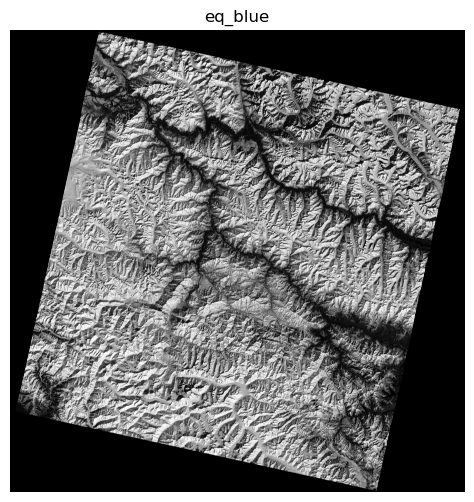

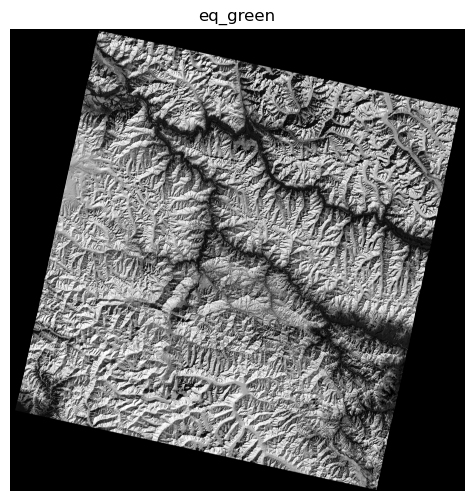

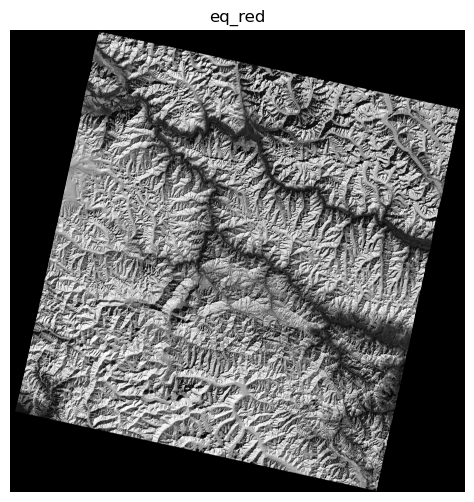

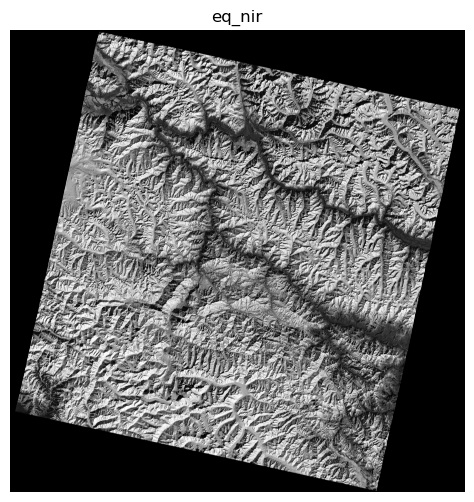

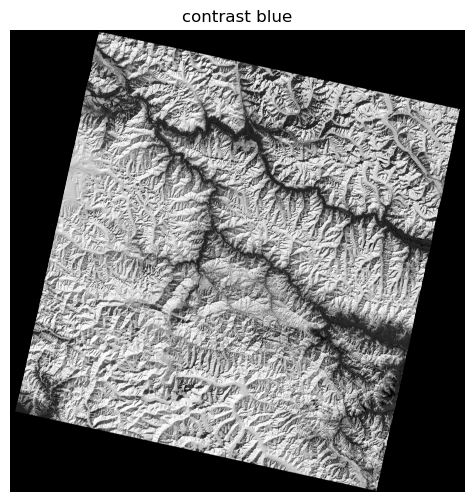

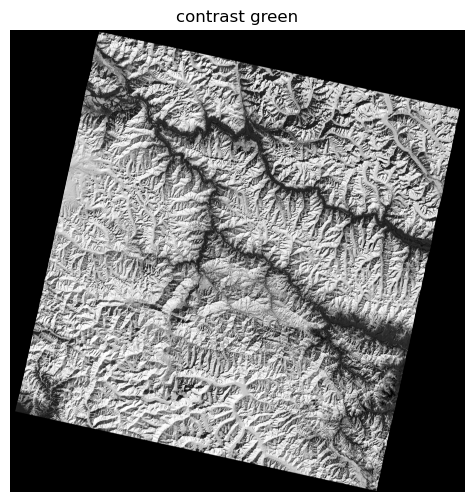

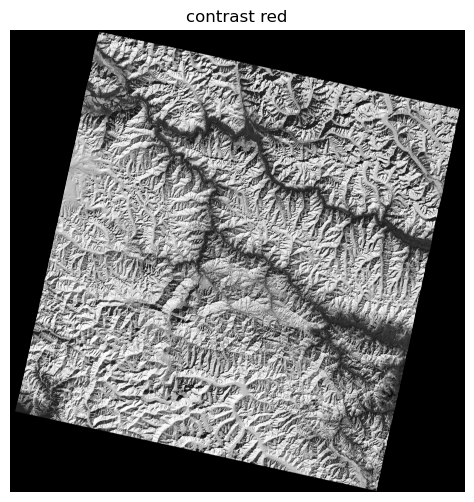

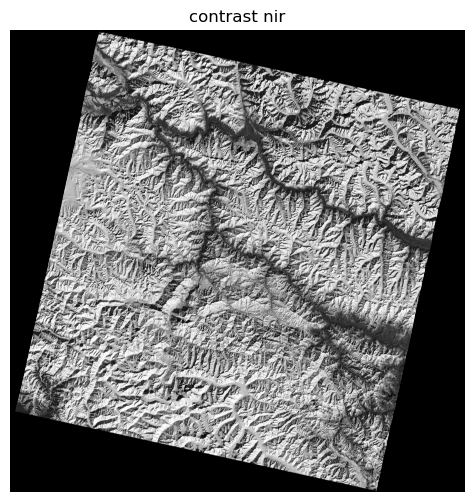

In [36]:
display_image(blue_band_eq,'eq_blue')
display_image(green_band_eq, 'eq_green')
display_image(red_band_eq,'eq_red')
display_image(nir_band_eq,'eq_nir')
display_image(blue_band_contrast,'contrast blue')
display_image(green_band_contrast,'contrast green')
display_image(red_band_contrast,'contrast red')
display_image(nir_band_contrast,'contrast nir')